### A06 심화프로젝트(마케팅데이터 고객군집)

### order_delivered_timestamp 변수 사용 버전

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import os
from scipy.stats import boxcox
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
import folium
import missingno as msno

pd.options.display.max_rows = 20

In [4]:
# ! pip install folium

In [5]:
# ! pip install missingno

- 데이터 임포트(파일경로 지정해주세요!)

In [8]:
customers = pd.read_csv('customers.csv')
order_items = pd.read_csv('order_items.csv')
orders = pd.read_csv('orders.csv')
payments = pd.read_csv('payments.csv')
products = pd.read_csv('products.csv')

In [9]:
state_df = customers.groupby(['customer_zip_code_prefix','customer_state']).size().to_frame().drop(columns = 0)

In [10]:
state_df.head()

,
customer_zip_code_prefix,customer_state
1003,SP
1004,SP
1005,SP
1006,SP
1007,SP


- 데이터 병합
  - order_id, customer_id, product_id를 기준으로 데이터를 병합

In [12]:
m1 = pd.merge(orders, order_items, how = 'right', on = 'order_id')
m2 = pd.merge(m1, customers, how = 'left', on = 'customer_id')
m3 = pd.merge(m2, payments, how = 'left', on = 'order_id')
df = pd.merge(m3, products, how = 'left', on = 'product_id')

- 중복데이터로 추정 문제 발생 -> drop할지 정해야할듯

In [14]:
drop_target_col = list(df.columns)

In [15]:
drop_target_col.remove('order_item_id')

In [16]:
df = df.drop_duplicates(subset = drop_target_col, ignore_index = True)

- 분석 제외 변수 설정
  - [order table] order_estimated_delivery_date 제거
  - [order_items table] order_item_id, product_id, seller_id 제거
  - [customers table] customer_zip_code_prefix, customer_city 제거

In [18]:
df = df.drop(columns = ['order_estimated_delivery_date',\
              'order_item_id', 'product_id', 'seller_id'])

- 결측치 처리
  - 데이터 결합 후 외래 키가 없어 추가 결측이 생길 수 있으므로 데이터 merge 후 결측치 처리 진행
  - order_delivered_timestamp 결측치 대부분은 order_status가 'delivered'가 아닌 데이터로 분석이 유의미하지 않으므로 삭제
  - product_category_name은 주요 변수이며, 'toys'가 약 75%를 차지하므로 최빈값인 'toys'로 대체
  - payment_sequential ~ payment_value / product_weight_g ~ product_width_cm의 결측치는 그 수가 상대적으로 많지 않으므로 삭제

In [20]:
df.isnull().sum()

order_id                        0
customer_id                     0
order_status                    0
order_purchase_timestamp        0
order_approved_at              14
order_delivered_timestamp    2359
price                           0
shipping_charges                0
customer_zip_code_prefix        0
customer_city                   0
customer_state                  0
payment_sequential              1
payment_type                    1
payment_installments            1
payment_value                   1
product_category_name         380
product_weight_g               18
product_length_cm              18
product_height_cm              18
product_width_cm               18
dtype: int64

In [21]:
df.dropna(subset = 'order_delivered_timestamp', inplace = True)

In [22]:
df.product_category_name = df.product_category_name.fillna(df.product_category_name.mode()[0])

In [23]:
df = df.dropna().reset_index(drop = True)

In [24]:
df.isnull().sum()

order_id                     0
customer_id                  0
order_status                 0
order_purchase_timestamp     0
order_approved_at            0
order_delivered_timestamp    0
price                        0
shipping_charges             0
customer_zip_code_prefix     0
customer_city                0
customer_state               0
payment_sequential           0
payment_type                 0
payment_installments         0
payment_value                0
product_category_name        0
product_weight_g             0
product_length_cm            0
product_height_cm            0
product_width_cm             0
dtype: int64

- 범주형변수 인코딩
  - payment_type 원-핫 인코딩
  - customer_state 라벨인코딩

In [26]:
df.select_dtypes('object').columns

Index(['order_id', 'customer_id', 'order_status', 'order_purchase_timestamp',
       'order_approved_at', 'order_delivered_timestamp', 'customer_city',
       'customer_state', 'payment_type', 'product_category_name'],
      dtype='object')

In [27]:
from sklearn.preprocessing import OneHotEncoder

oe = OneHotEncoder()
oe.fit(df[['payment_type']])
column_csr = oe.transform(df[['payment_type']])
column_csr_df = pd.DataFrame(column_csr.toarray(), columns = oe.get_feature_names_out())
df = pd.concat([df, column_csr_df],axis = 1)

In [28]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
df['customer_state_label'] = le.fit_transform(df.customer_state)

- 날짜변수 처리
  - order_purchase_timestamp 변수를 datetime 형식으로 변환

In [30]:
df['order_purchase_timestamp'] = pd.to_datetime(df['order_purchase_timestamp'])
df['order_approved_at'] = pd.to_datetime(df['order_approved_at'])
df['order_delivered_timestamp'] = pd.to_datetime(df['order_delivered_timestamp'])

- 파생변수 생성
  - real_payment = price + shipping_charges
  - state_freq = customer_state의 빈도
  - category_freq = product_category_name의 빈도
  - delivery_time = order_delivered_timestamp - order_approved_at (일수기준)
  - category_name_top30 : 구매 상위 30개 상품 카테고리인 경우 표시, 그렇지 않은 경우 'else'로 표시

In [32]:
df['real_payment'] = df['price'] + df['shipping_charges']
df['state_freq'] = df['customer_state'].map(df['customer_state'].value_counts())
df['category_freq'] = df['product_category_name'].map(df['product_category_name'].value_counts())
df['order_delivery_days'] = (pd.to_datetime(df['order_delivered_timestamp']) - pd.to_datetime(df['order_approved_at'])).dt.days

- 추가 파생변수 생성
  - approvement_time : 승인까지 걸리는 시간 집계
  - payment_weekend : 주말 결제여부

In [34]:
df['order_approvement_days'] = (pd.to_datetime(df['order_approved_at']) - pd.to_datetime(df['order_purchase_timestamp'])).dt.days

In [35]:
df['payment_weekend'] = df.order_purchase_timestamp.map(lambda x : 1 if x.weekday() in [5, 6] else 0)

In [36]:
df['payment_weekend'].value_counts()

payment_weekend
0    81109
1    24172
Name: count, dtype: int64

- 데이터 집계
  - order_id 기준의 데이터를 groupby를 이용하여 customer_id 기준 데이터로 변환한다.
  - 각종 수치형변수는 필요한 함수로 연산한다.
  - 고객의 상위 30개 상품 카테고리별 구매 횟수를 집계하여 병합한다.
  - 고객의 주매 요일과 시간대를 별도로 집계하여 병합한다.
  - 고객의 최종 거주지역을 별도로 집계하여 병합한다.

In [38]:
cus_df = df.groupby('customer_zip_code_prefix').agg({
    'order_id' : 'nunique',
    #purchase frequency
    'payment_sequential' : 'count',
    #frequency-encoding
    'state_freq' : 'mean',
    'category_freq' : 'mean',
    #prices
    'real_payment' : ['mean', 'max', 'sum'],
    'payment_value':['mean', 'max', 'sum'],
    #datetime
    'order_approved_at': 'min',
    'order_delivered_timestamp': 'max',
    'order_delivery_days' : 'mean',
    'order_approvement_days' : 'mean',
    'payment_weekend' : 'mean',
    #sizes
    'product_weight_g' : ['mean', 'max'],
    'product_length_cm' : ['mean', 'max'],
    'product_height_cm' : ['mean', 'max'],
    'product_width_cm' : ['mean', 'max'],
    #one-hot-encoding
    'payment_type_credit_card' : 'mean',
    'payment_type_debit_card' : 'mean',
    'payment_type_voucher' : 'mean',
    'payment_type_wallet' : 'mean'
})

In [39]:
cus_df.columns = ['_'.join(col).strip() for col in cus_df.columns.values]

In [40]:
zip_code_payment_dayname = df.groupby(['customer_zip_code_prefix', df.order_purchase_timestamp.dt.day_name()]).size().unstack(1, fill_value = 0)
zip_code_payment_hour = df.groupby(['customer_zip_code_prefix', df.order_purchase_timestamp.dt.hour]).size().unstack(1, fill_value = 0)

In [41]:
zip_code_payment_weekend = df.groupby(['customer_zip_code_prefix', df.order_purchase_timestamp.dt.day_name()]).size().unstack(1, fill_value = 0)

In [42]:
target = df[['order_id','customer_zip_code_prefix','customer_state']]
zip_code_state = target.sort_values(by = 'customer_zip_code_prefix').drop_duplicates(subset = 'customer_zip_code_prefix', keep = 'last').drop(columns = 'order_id')

In [43]:
target_df = df[['customer_zip_code_prefix','product_category_name']].copy()
target_index = df.product_category_name.value_counts()[:20].index
target_df['product_category_name_top30'] = target_df.product_category_name.map(lambda x : x if x in target_index else 'else')
product_category_name_top30 = target_df.groupby(['customer_zip_code_prefix','product_category_name_top30']).size().unstack(fill_value = 0)

In [44]:
m1 = pd.merge(cus_df, zip_code_payment_dayname, on = 'customer_zip_code_prefix')

In [45]:
m2 = pd.merge(m1, zip_code_payment_hour, on = 'customer_zip_code_prefix')

In [46]:
m2.columns

Index([             'order_id_nunique',      'payment_sequential_count',
                     'state_freq_mean',            'category_freq_mean',
                   'real_payment_mean',              'real_payment_max',
                    'real_payment_sum',            'payment_value_mean',
                   'payment_value_max',             'payment_value_sum',
               'order_approved_at_min', 'order_delivered_timestamp_max',
            'order_delivery_days_mean',   'order_approvement_days_mean',
                'payment_weekend_mean',         'product_weight_g_mean',
                'product_weight_g_max',        'product_length_cm_mean',
               'product_length_cm_max',        'product_height_cm_mean',
               'product_height_cm_max',         'product_width_cm_mean',
                'product_width_cm_max', 'payment_type_credit_card_mean',
        'payment_type_debit_card_mean',     'payment_type_voucher_mean',
            'payment_type_wallet_mean',            

In [47]:
m2.columns = list(m2.columns[:list(m2.columns).index('Wednesday')+1]) + [f'{x}h' for x in range(24)]

In [48]:
zip_code_df_merge = pd.merge(m2, product_category_name_top30, on = 'customer_zip_code_prefix')

### RFM을 이용한 군집분석

- R: Recency(최근성)
  - 고객 ID별 마지막 접속시점 파악
  - 가장 마지막 접속한 ID의 접속시점 대비 경과일수로 계산

In [53]:
pd.options.display.max_rows = 20
df = df.sort_values(by = ['customer_zip_code_prefix','order_purchase_timestamp'])

In [54]:
last_purchase_timestamp = df.drop_duplicates(subset = 'customer_zip_code_prefix', keep='last')[['customer_zip_code_prefix','order_purchase_timestamp']].rename(columns = {'order_purchase_timestamp':'last_purchase_timestamp'}).set_index('customer_zip_code_prefix')
last_purchase_timestamp

,last_purchase_timestamp
customer_zip_code_prefix,
1003,2018-05-10 09:12:00
1004,2018-06-13 11:21:00
1005,2018-08-14 14:48:00
1006,2018-04-12 12:43:00
1007,2018-08-24 18:00:00
...,...
99955,2018-04-11 17:29:00
99960,2017-11-14 06:53:00
99965,2018-01-10 12:06:00


In [55]:
last_purchase_timestamp['Recency'] = (last_purchase_timestamp.max().iloc[0] - last_purchase_timestamp['last_purchase_timestamp']).dt.days + 1

In [56]:
last_purchase_timestamp

,last_purchase_timestamp,Recency
customer_zip_code_prefix,,
1003,2018-05-10 09:12:00,112
1004,2018-06-13 11:21:00,78
1005,2018-08-14 14:48:00,16
1006,2018-04-12 12:43:00,140
1007,2018-08-24 18:00:00,5
...,...,...
99955,2018-04-11 17:29:00,140
99960,2017-11-14 06:53:00,289
99965,2018-01-10 12:06:00,232


- F: Frequency (최빈성)
  - order_id_nunique 로 활용
  - (아이디어)

- M: Monetary (금액)
  - payment_value_mean 활용

In [59]:
rfm_df = zip_code_df_merge[['order_id_nunique','payment_value_sum']].copy()

In [60]:
rfm_df['Recency'] = last_purchase_timestamp['Recency']

In [61]:
rfm_df = rfm_df.rename(columns = {'order_id_nunique':'Frequency', 'payment_value_sum':'Monetary'})[['Recency','Frequency','Monetary']]

In [62]:
rfm_df.isnull().sum()

Recency      0
Frequency    0
Monetary     0
dtype: int64

C:\Users\user\AppData\Local\Temp\ipykernel_11944\3839588064.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(rfm_df.Frequency.value_counts()[:20], palette = 'RdYlBu', edgecolor = 'black', errorbar= None)


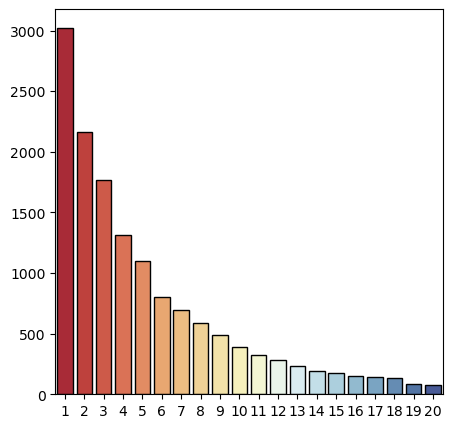

In [63]:
plt.figure(figsize = (5, 5))
sns.barplot(rfm_df.Frequency.value_counts()[:20], palette = 'RdYlBu', edgecolor = 'black', errorbar= None)
plt.xlabel('')
plt.ylabel('')
plt.show()

- Boxcox 변환

In [65]:
Recency_boxcox, Recency_lambda = boxcox(rfm_df.Recency)

In [66]:
Frequency_boxcox, Frequency_lambda = boxcox(rfm_df.Frequency)

In [67]:
Monetary_boxcox, Monetary_lambda = boxcox(rfm_df.Monetary)

In [68]:
Recency_lambda, Frequency_lambda, Monetary_lambda

(0.12184294903820735, -0.12763157017200732, 0.04047856677698469)

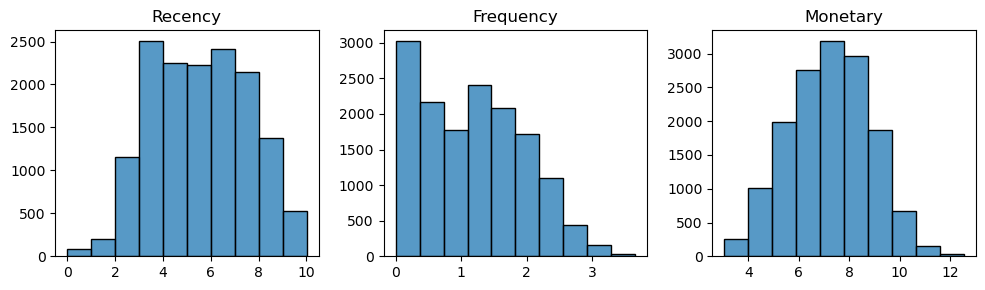

In [69]:
plt.figure(figsize = (10, 3))
plt.subplot(131)
sns.histplot(Recency_boxcox, bins = 10)
plt.ylabel('')
plt.title('Recency')
plt.subplot(132)
sns.histplot(Frequency_boxcox, bins = 10)
plt.ylabel('')
plt.title('Frequency')
plt.subplot(133)
sns.histplot(Monetary_boxcox, bins = 10)
plt.ylabel('')
plt.title('Monetary')
plt.tight_layout()
plt.show()

In [70]:
rfm_df['Recency_boxcox'] = Recency_boxcox

In [71]:
rfm_df['Frequency_boxcox'] = Frequency_boxcox

In [72]:
rfm_df['Monetary_boxcox'] = Monetary_boxcox

- Min Max Scaling

In [74]:
mm = MinMaxScaler()

In [75]:
rfm_df_mm = pd.DataFrame(mm.fit_transform(rfm_df[['Recency_boxcox','Frequency_boxcox','Monetary_boxcox']]), index = rfm_df.index)

In [76]:
rfm_df_mm.columns = ['Recency_boxcox_mm','Frequency_boxcox_mm','Monetary_boxcox_mm']

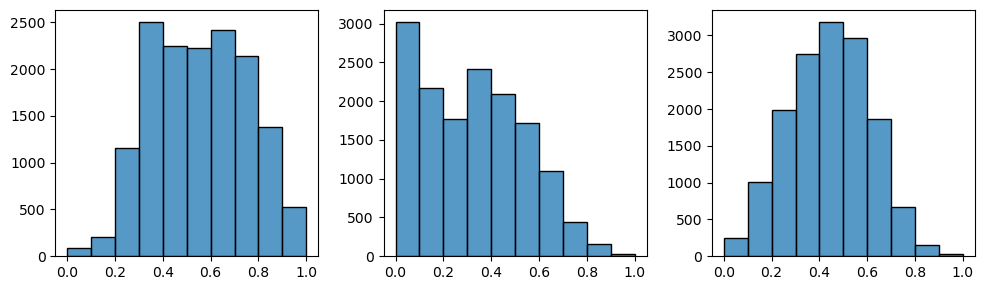

In [77]:
plt.figure(figsize = (10, 3))
plt.subplot(131)
sns.histplot(rfm_df_mm['Recency_boxcox_mm'], bins = 10)
plt.ylabel('')
plt.xlabel('')
#plt.title('Recency boxcox hist')
plt.subplot(132)
sns.histplot(rfm_df_mm['Frequency_boxcox_mm'], bins = 10)
plt.ylabel('')
plt.xlabel('')
#plt.title('Frequency boxcox hist')
plt.subplot(133)
sns.histplot(rfm_df_mm['Monetary_boxcox_mm'], bins = 10)
plt.ylabel('')
plt.xlabel('')
#plt.title('Monetary boxcox hist')
plt.tight_layout()
plt.show()

In [78]:
np.linspace(start = 0, stop=1, num = 5)

array([0.  , 0.25, 0.5 , 0.75, 1.  ])

In [79]:
rfm_df_mm['Recency_boxcox_mm'].value_counts(bins = 10).sort_index()

(-0.002, 0.1]      88
(0.1, 0.2]        201
(0.2, 0.3]       1159
(0.3, 0.4]       2505
(0.4, 0.5]       2246
(0.5, 0.6]       2225
(0.6, 0.7]       2415
(0.7, 0.8]       2144
(0.8, 0.9]       1380
(0.9, 1.0]        526
Name: count, dtype: int64

C:\Users\user\AppData\Local\Temp\ipykernel_11944\1104123652.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(rfm_df_mm['Recency_boxcox_mm'].value_counts(bins = 10).sort_index(), palette = 'RdYlBu', edgecolor = 'black', errorbar= None)
C:\Users\user\AppData\Local\Temp\ipykernel_11944\1104123652.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(rfm_df_mm['Frequency_boxcox_mm'].value_counts(bins = 10).sort_index(), palette = 'RdYlBu', edgecolor = 'black', errorbar= None)
C:\Users\user\AppData\Local\Temp\ipykernel_11944\1104123652.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legen

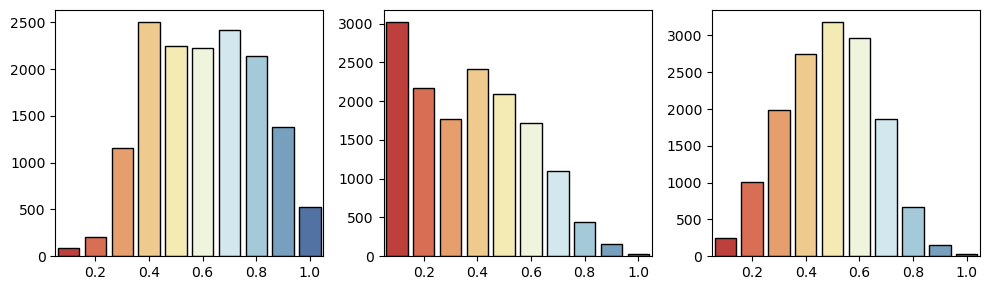

In [80]:
plt.figure(figsize = (10, 3))
plt.subplot(131)
sns.barplot(rfm_df_mm['Recency_boxcox_mm'].value_counts(bins = 10).sort_index(), palette = 'RdYlBu', edgecolor = 'black', errorbar= None)
plt.xlabel('')
plt.xticks(range(1, 11, 2), labels = [0.2, 0.4, 0.6, 0.8, 1.0])
plt.ylabel('')
plt.xlabel('')
#plt.title('Recency boxcox hist')
plt.subplot(132)
sns.barplot(rfm_df_mm['Frequency_boxcox_mm'].value_counts(bins = 10).sort_index(), palette = 'RdYlBu', edgecolor = 'black', errorbar= None)
plt.xticks(range(1, 11, 2), labels = [0.2, 0.4, 0.6, 0.8, 1.0])
plt.ylabel('')
plt.xlabel('')
#plt.title('Frequency boxcox hist')
plt.subplot(133)
sns.barplot(rfm_df_mm['Monetary_boxcox_mm'].value_counts(bins = 10).sort_index(), palette = 'RdYlBu', edgecolor = 'black', errorbar= None)
plt.xticks(range(1, 11, 2), labels = [0.2, 0.4, 0.6, 0.8, 1.0])
plt.ylabel('')
plt.xlabel('')
#plt.title('Monetary boxcox hist')
plt.tight_layout()
plt.show()

In [81]:
rfm_df_mm.head()

,Recency_boxcox_mm,Frequency_boxcox_mm,Monetary_boxcox_mm
customer_zip_code_prefix,,,
1003,0.637279,0.000000,0.211480
1004,0.574427,0.181567,0.300835
1005,0.329629,0.438378,0.441989
1006,0.677449,0.181567,0.499627
1007,0.177694,0.347762,0.425505


- KMeans 군집 수행
  - 최적 군집 결정을 위해 실루엣 계수 확인

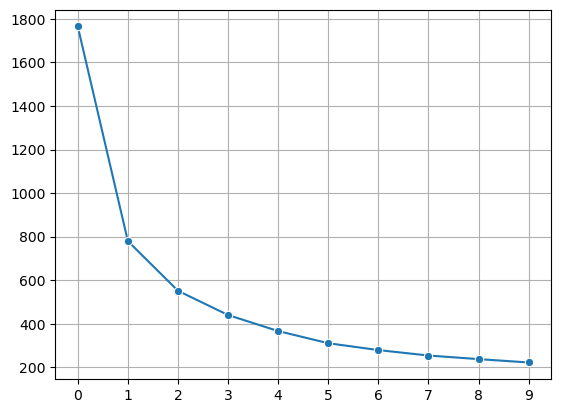

In [83]:
sse = []

for i in range(1, 11):
    RFM_km = KMeans(n_clusters=i, random_state=42)
    RFM_km.fit(rfm_df_mm)
    sse.append(RFM_km.inertia_)
sns.lineplot(sse, marker = 'o')
plt.grid()
plt.xticks(list(range(10)))
plt.show()

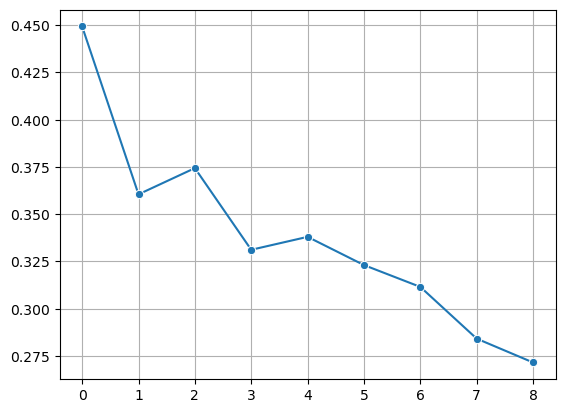

In [84]:
silhouette= []

for i in range(2, 11):
    RFM_km = KMeans(n_clusters=i, random_state=42)
    RFM_km.fit(rfm_df_mm)
    silhouette.append(silhouette_score(rfm_df_mm, RFM_km.labels_))
sns.lineplot(silhouette, marker = 'o')
plt.grid()
plt.show()

In [85]:
RFM_km_final = KMeans(n_clusters=3, random_state=42)

In [86]:
RFM_km_final.fit(rfm_df_mm)

KMeans(n_clusters=3, random_state=42)

In [87]:
rfm_df_mm['label_RFM'] = RFM_km_final.labels_

In [88]:
rfm_df_mm.head()

,Recency_boxcox_mm,Frequency_boxcox_mm,Monetary_boxcox_mm,label_RFM
customer_zip_code_prefix,,,,
1003,0.637279,0.000000,0.211480,1
1004,0.574427,0.181567,0.300835,1
1005,0.329629,0.438378,0.441989,0
1006,0.677449,0.181567,0.499627,2
1007,0.177694,0.347762,0.425505,0


In [89]:
rfm_df_mm.groupby('label_RFM').mean()

,Recency_boxcox_mm,Frequency_boxcox_mm,Monetary_boxcox_mm
label_RFM,,,
0,0.361990,0.584011,0.619787
1,0.744836,0.064400,0.261678
2,0.557234,0.337130,0.442532


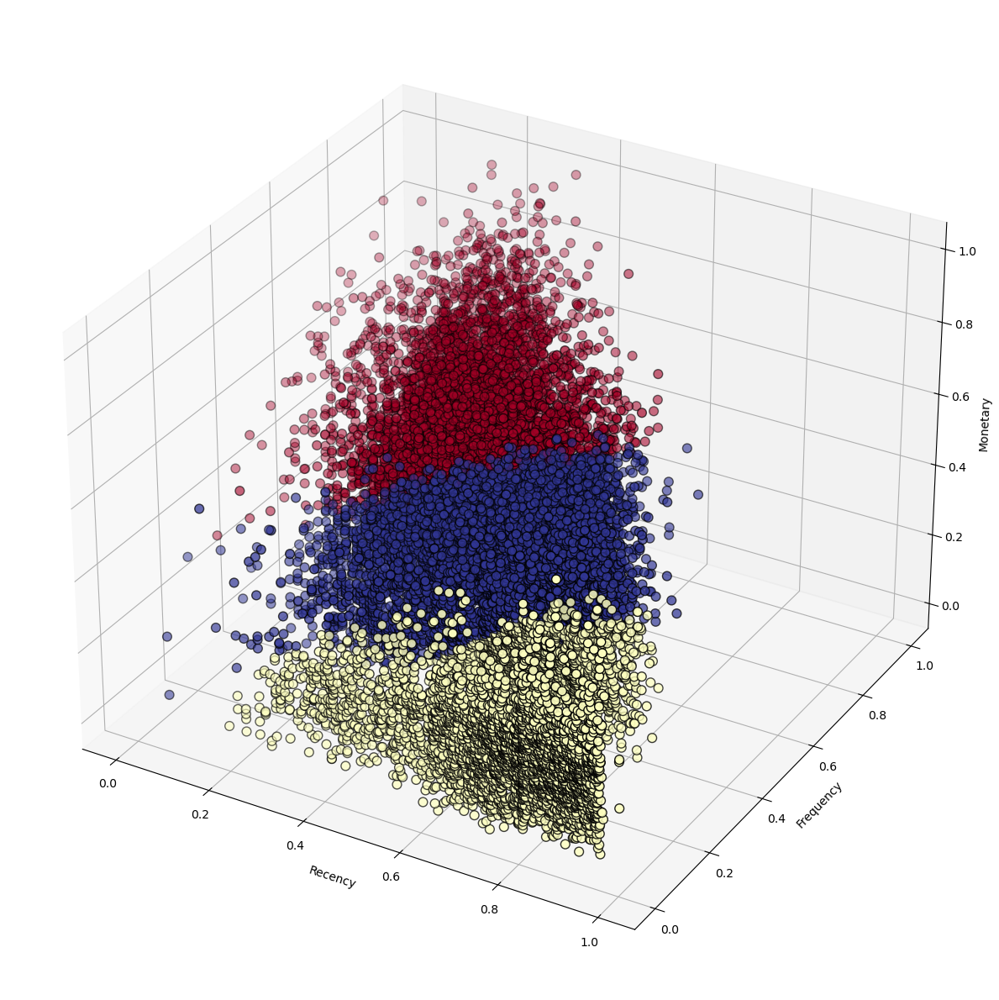

In [90]:
# Cluster_1 -> 붉은색
# Cluster_2 -> 노란색
# Cluster_2 -> 파란색

fig = plt.figure(figsize = (12, 12))
ax = fig.add_subplot(111, projection='3d')
target = rfm_df_mm.loc[rfm_df_mm.label_RFM.isin([0, 1, 2])]
scatter = ax.scatter(target['Recency_boxcox_mm'], target['Frequency_boxcox_mm'], target['Monetary_boxcox_mm'], c=target['label_RFM'], s=60, edgecolors = 'black', depthshade= True, cmap='RdYlBu')
ax.set_xlabel('Recency')
ax.set_ylabel('Frequency')
ax.set_zlabel('Monetary')
# ax.set_title('Scatter plot of RFM by KMeans Clusting', fontsize = 15)
#plt.legend()
plt.tight_layout()
plt.show()

In [91]:
zip_code_df_RFM = pd.concat([zip_code_df_merge, rfm_df_mm['label_RFM']], axis = 1)

In [92]:
pd.options.display.max_rows = None
summary_df = zip_code_df_RFM.groupby('label_RFM').mean(numeric_only = True).T

In [93]:
summary_sum = np.array(summary_df.sum(axis = 1)).reshape(-1, 1)

In [94]:
summary_df.columns = [f'Cluster_{i}' for i in range(1, len(summary_df.columns) +1)]

In [95]:
summary_ratio_df = summary_df / summary_sum

In [96]:
summary_ratio_df.index

Index(['order_id_nunique', 'payment_sequential_count', 'state_freq_mean',
       'category_freq_mean', 'real_payment_mean', 'real_payment_max',
       'real_payment_sum', 'payment_value_mean', 'payment_value_max',
       'payment_value_sum', 'order_delivery_days_mean',
       'order_approvement_days_mean', 'payment_weekend_mean',
       'product_weight_g_mean', 'product_weight_g_max',
       'product_length_cm_mean', 'product_length_cm_max',
       'product_height_cm_mean', 'product_height_cm_max',
       'product_width_cm_mean', 'product_width_cm_max',
       'payment_type_credit_card_mean', 'payment_type_debit_card_mean',
       'payment_type_voucher_mean', 'payment_type_wallet_mean', 'Friday',
       'Monday', 'Saturday', 'Sunday', 'Thursday', 'Tuesday', 'Wednesday',
       '0h', '1h', '2h', '3h', '4h', '5h', '6h', '7h', '8h', '9h', '10h',
       '11h', '12h', '13h', '14h', '15h', '16h', '17h', '18h', '19h', '20h',
       '21h', '22h', '23h', 'auto', 'baby', 'bed_bath_table',
      

- 시각화

In [98]:
summary_df.index

Index(['order_id_nunique', 'payment_sequential_count', 'state_freq_mean',
       'category_freq_mean', 'real_payment_mean', 'real_payment_max',
       'real_payment_sum', 'payment_value_mean', 'payment_value_max',
       'payment_value_sum', 'order_delivery_days_mean',
       'order_approvement_days_mean', 'payment_weekend_mean',
       'product_weight_g_mean', 'product_weight_g_max',
       'product_length_cm_mean', 'product_length_cm_max',
       'product_height_cm_mean', 'product_height_cm_max',
       'product_width_cm_mean', 'product_width_cm_max',
       'payment_type_credit_card_mean', 'payment_type_debit_card_mean',
       'payment_type_voucher_mean', 'payment_type_wallet_mean', 'Friday',
       'Monday', 'Saturday', 'Sunday', 'Thursday', 'Tuesday', 'Wednesday',
       '0h', '1h', '2h', '3h', '4h', '5h', '6h', '7h', '8h', '9h', '10h',
       '11h', '12h', '13h', '14h', '15h', '16h', '17h', '18h', '19h', '20h',
       '21h', '22h', '23h', 'auto', 'baby', 'bed_bath_table',
      

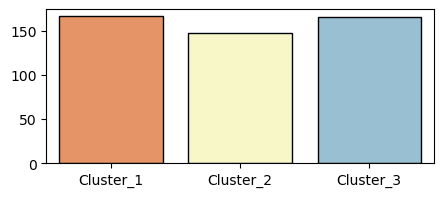

In [99]:
value_column = ['payment_value_mean']

plt.figure(figsize = (5, 2))
sns.barplot(summary_df.loc[value_column,:], palette = 'RdYlBu', edgecolor = 'black', errorbar= None)
plt.show()

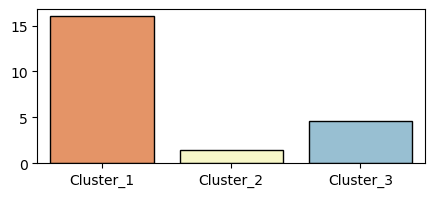

In [100]:
value_column = ['payment_sequential_count']

plt.figure(figsize = (5, 2))
sns.barplot(summary_df.loc[value_column,:], palette = 'RdYlBu', edgecolor = 'black', errorbar= None)
# plt.title('payment sequential counts by groups')
plt.show()

In [101]:
summary_df.head()

,Cluster_1,Cluster_2,Cluster_3
order_id_nunique,14.711046,1.373821,4.235914
payment_sequential_count,15.999326,1.469241,4.593881
state_freq_mean,24492.210822,15671.935115,20000.932787
category_freq_mean,60150.555221,60234.273482,60137.070085
real_payment_mean,150.551088,140.084308,153.460728


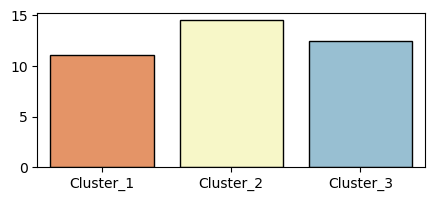

In [102]:
value_column = ['order_delivery_days_mean']

plt.figure(figsize = (5, 2))
sns.barplot(summary_df.loc[value_column,:], palette = 'RdYlBu', edgecolor = 'black', errorbar= None)
# plt.title('days taken after payment by groups')
plt.show()

C:\Users\user\AppData\Local\Temp\ipykernel_11944\788958214.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(summary_df.loc[col,:], palette = 'RdYlBu', edgecolor = 'black', errorbar= None)


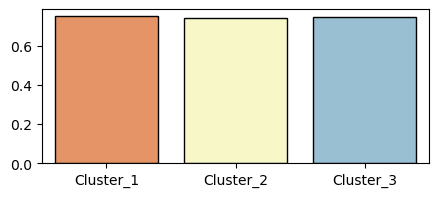

C:\Users\user\AppData\Local\Temp\ipykernel_11944\788958214.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(summary_df.loc[col,:], palette = 'RdYlBu', edgecolor = 'black', errorbar= None)


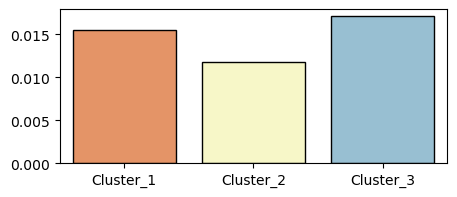

C:\Users\user\AppData\Local\Temp\ipykernel_11944\788958214.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(summary_df.loc[col,:], palette = 'RdYlBu', edgecolor = 'black', errorbar= None)


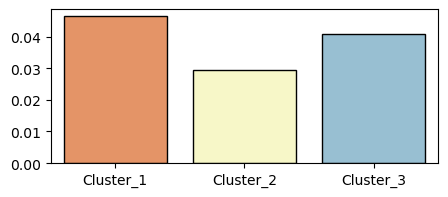

C:\Users\user\AppData\Local\Temp\ipykernel_11944\788958214.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(summary_df.loc[col,:], palette = 'RdYlBu', edgecolor = 'black', errorbar= None)


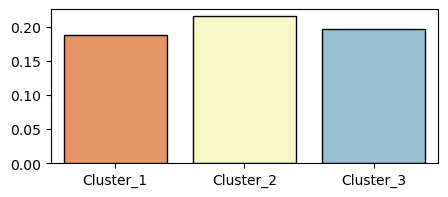

In [103]:
value_column = ['payment_type_credit_card_mean','payment_type_debit_card_mean','payment_type_voucher_mean','payment_type_wallet_mean']

for col in value_column:
    plt.figure(figsize = (5, 2))
    sns.barplot(summary_df.loc[col,:], palette = 'RdYlBu', edgecolor = 'black', errorbar= None)
    # plt.title('days taken after payment by groups')
    plt.ylabel('')
    plt.show()

In [104]:
zip_code_df_RFM.groupby('label_RFM')[['product_length_cm_mean', 'product_width_cm_mean','product_height_cm_mean']].agg(['mean','std']).T

label_RFM                            0          1          2
product_length_cm_mean mean  30.341619  29.910709  29.677821
                       std    5.153175  14.503858   8.546590
product_width_cm_mean  mean  23.276497  22.851660  22.745369
                       std    3.810988  10.723601   6.279553
product_height_cm_mean mean  16.644858  15.769298  16.435515
                       std    4.343751  11.875408   7.397340

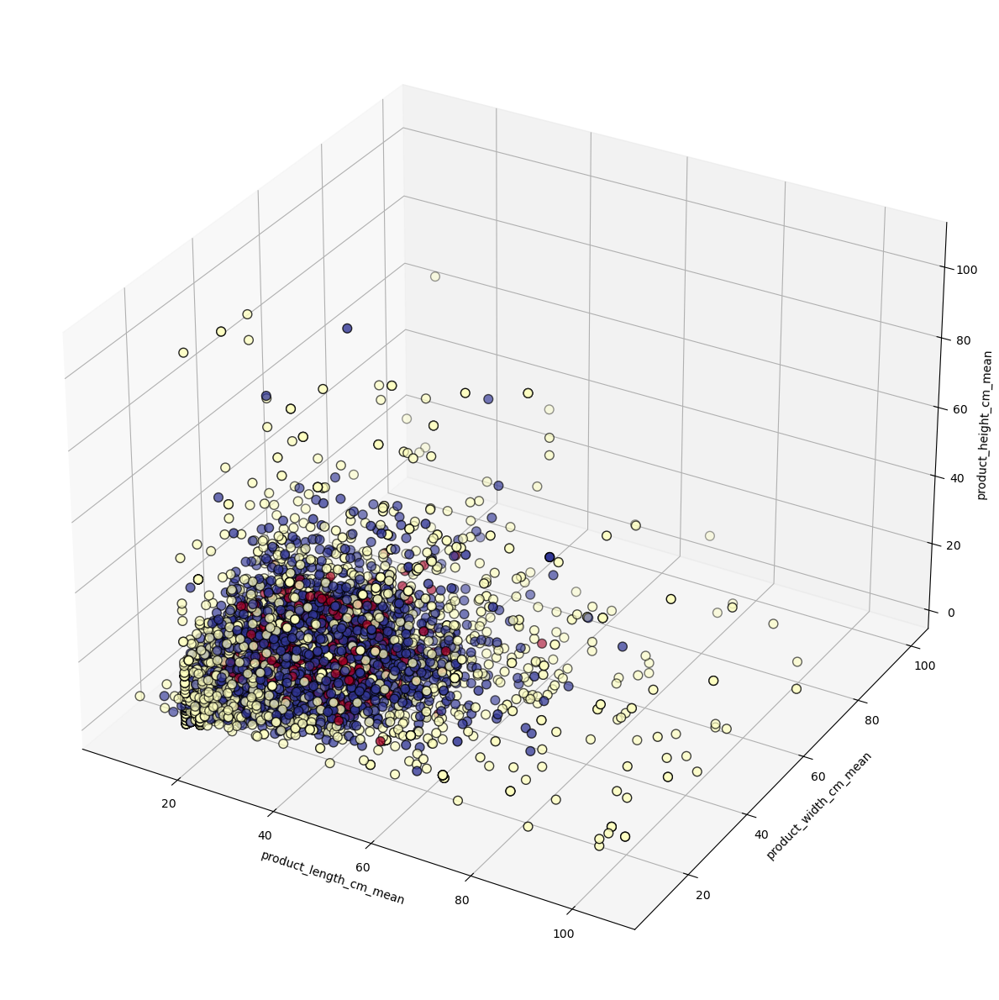

In [105]:
zip_code_df_RFM

fig = plt.figure(figsize = (12, 12))
ax = fig.add_subplot(111, projection='3d')
target = zip_code_df_RFM.loc[zip_code_df_RFM.label_RFM.isin([0, 1, 2])]
scatter = ax.scatter(target['product_length_cm_mean'], target['product_width_cm_mean'], target['product_height_cm_mean'], c=target['label_RFM'], s=60, depthshade= True, edgecolors = 'black', cmap='RdYlBu')
ax.set_xlabel('product_length_cm_mean')
ax.set_ylabel('product_width_cm_mean')
ax.set_zlabel('product_height_cm_mean')
# ax.set_title('Scatter plot of RFM by KMeans Clusting', fontsize = 15)
#plt.legend()
plt.tight_layout()
plt.show()

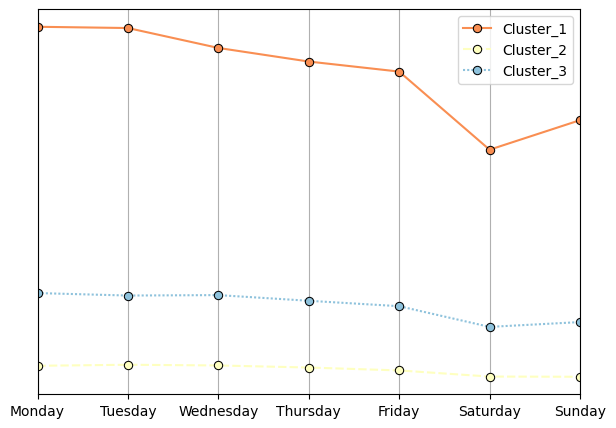

In [106]:
value_column = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

plt.figure(figsize = (7, 5))
sns.lineplot(summary_df.loc[value_column,:], palette='RdYlBu', markers =['o','o','o'], markeredgecolor = 'black')#.plot(kind = 'line', figsize = (10,5))
plt.xlim(0, 6)
plt.grid()
plt.yticks([])
plt.show()

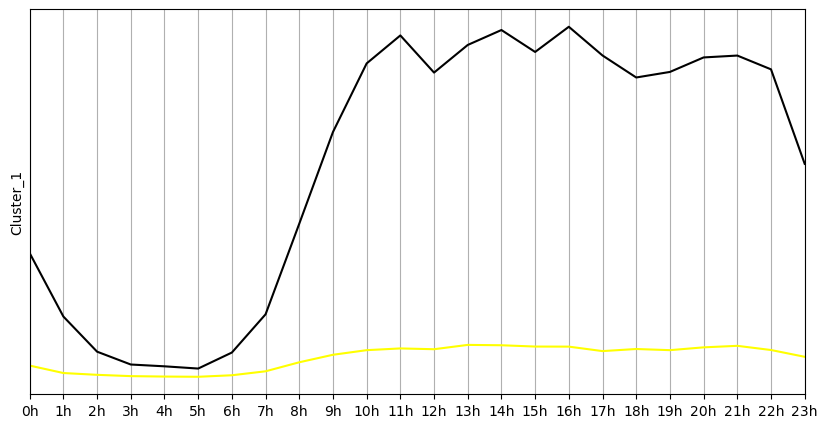

In [108]:
value_column = ['0h', '1h', '2h', '3h', '4h', '5h', '6h', '7h', '8h', '9h', '10h',
       '11h', '12h', '13h', '14h', '15h', '16h', '17h', '18h', '19h', '20h',
       '21h', '22h', '23h']
plt.figure(figsize = (10, 5))
sns.lineplot(summary_df.loc[value_column,'Cluster_1'], color='black', markers ='o', markeredgecolor = 'black')
sns.lineplot(summary_df.loc[value_column,'Cluster_2'], color='yellow', markers =['o'], markeredgecolor = 'black')#.plot(kind = 'line', figsize = (10,5))
plt.xlim(0, 23)
plt.grid()
plt.yticks([])
plt.show()

In [109]:
summary_df

,Cluster_1,Cluster_2,Cluster_3
order_id_nunique,14.711046,1.373821,4.235914
payment_sequential_count,15.999326,1.469241,4.593881
state_freq_mean,24492.210822,15671.935115,20000.932787
category_freq_mean,60150.555221,60234.273482,60137.070085
real_payment_mean,150.551088,140.084308,153.460728
real_payment_max,576.726549,155.204506,305.889639
real_payment_sum,2324.809847,194.052616,655.548871
payment_value_mean,166.351099,147.203377,165.691203
payment_value_max,632.459075,164.393873,329.625349
payment_value_sum,2555.249488,201.112959,704.594717


C:\Users\user\AppData\Local\Temp\ipykernel_11944\3138487193.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(summary_df.loc['toys',:], palette = 'RdYlBu', edgecolor = 'black', errorbar= None)


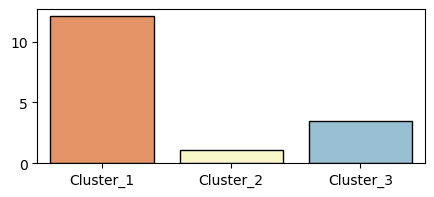

In [112]:
plt.figure(figsize = (5, 2))
sns.barplot(summary_df.loc['toys',:], palette = 'RdYlBu', edgecolor = 'black', errorbar= None)
# plt.title('days taken after payment by groups')
plt.ylabel('')
plt.show()

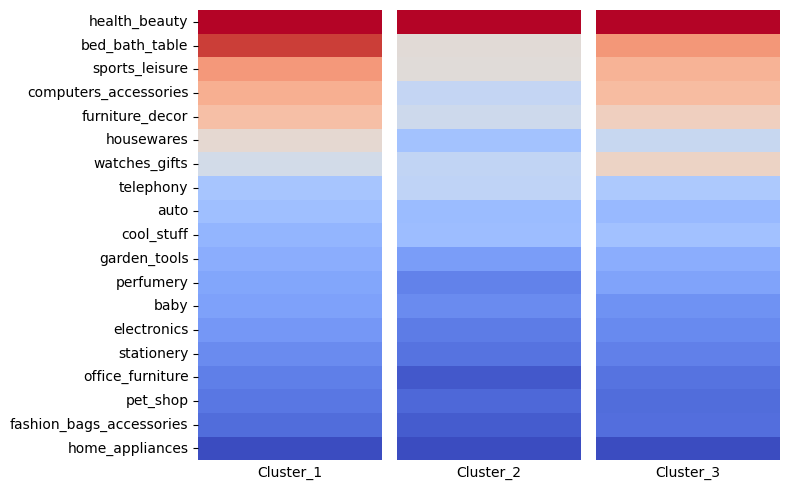

In [113]:
value_column = df.product_category_name.value_counts()[1:20].index
plt.figure(figsize = (8, 5))

plt.subplot(1, 3, 1)
sns.heatmap(summary_df.loc[value_column, 'Cluster_1'].to_frame(), cmap = 'coolwarm', cbar = False)
plt.xlabel('Cluster_1')
plt.xticks([])
plt.ylabel("")

for i, Cluster in zip(range(1, 3), ['Cluster_2','Cluster_3']):
    plt.subplot(1, 3, i+1)
    sns.heatmap(summary_df.loc[value_column, summary_df.columns[i]].to_frame(), cmap = 'coolwarm', cbar = False)
    plt.xlabel(Cluster)
    plt.xticks([])
    plt.ylabel("")
    plt.yticks([])
plt.tight_layout()
plt.show()

### 군집별 위치정보 이용

In [117]:
location_df = pd.read_csv('olist_geolocation_dataset.csv')

In [118]:
location_df.sort_values(by = 'geolocation_zip_code_prefix').head(10)

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
1246,1001,-23.549292,-46.633559,sao paulo,SP
429,1001,-23.550498,-46.634338,sao paulo,SP
1182,1001,-23.549779,-46.633957,sao paulo,SP
1435,1001,-23.549292,-46.633559,sao paulo,SP
326,1001,-23.551427,-46.634074,sao paulo,SP
1004,1001,-23.549292,-46.633559,sao paulo,SP
771,1001,-23.550498,-46.634338,sao paulo,SP
235,1001,-23.550642,-46.634410,sao paulo,SP
1062,1001,-23.550498,-46.634338,sao paulo,SP
897,1001,-23.549292,-46.633559,sao paulo,SP


In [119]:
location_mean = location_df.groupby('geolocation_zip_code_prefix').mean(numeric_only = True)

In [120]:
location_mean.head()

,geolocation_lat,geolocation_lng
geolocation_zip_code_prefix,,
1001,-23.550190,-46.634024
1002,-23.548146,-46.634979
1003,-23.548994,-46.635731
1004,-23.549799,-46.634757
1005,-23.549456,-46.636733


In [121]:
zip_code_location_df = pd.merge(rfm_df_mm, location_mean, how = 'left', left_index=True, right_index = True)

In [123]:
zip_code_location_df.head()

,Recency_boxcox_mm,Frequency_boxcox_mm,Monetary_boxcox_mm,label_RFM,geolocation_lat,geolocation_lng
customer_zip_code_prefix,,,,,,
1003,0.637279,0.000000,0.211480,1,-23.548994,-46.635731
1004,0.574427,0.181567,0.300835,1,-23.549799,-46.634757
1005,0.329629,0.438378,0.441989,0,-23.549456,-46.636733
1006,0.677449,0.181567,0.499627,2,-23.550102,-46.636137
1007,0.177694,0.347762,0.425505,0,-23.550046,-46.637251


In [126]:
zip_code_location_df.loc[zip_code_location_df.isnull().any(axis = 1)]

,Recency_boxcox_mm,Frequency_boxcox_mm,Monetary_boxcox_mm,label_RFM,geolocation_lat,geolocation_lng
customer_zip_code_prefix,,,,,,
2140,0.746810,0.000000,0.305194,1,NaN,NaN
6930,0.916931,0.000000,0.182537,1,NaN,NaN
7412,0.748683,0.000000,0.441239,1,NaN,NaN
7430,0.855506,0.000000,0.057859,1,NaN,NaN
7729,0.844215,0.000000,0.169438,1,NaN,NaN
7784,0.816411,0.000000,0.169102,1,NaN,NaN
8342,0.670828,0.000000,0.363186,1,NaN,NaN
8980,0.699684,0.181567,0.275695,1,NaN,NaN
11547,0.926580,0.000000,0.160255,1,NaN,NaN


In [130]:
zip_code_location_dropna_df = zip_code_location_df.dropna()

In [131]:
label_0_zip_code = zip_code_location_dropna_df.loc[zip_code_location_dropna_df.label_RFM == 0]

In [133]:
label_1_zip_code = zip_code_location_dropna_df.loc[zip_code_location_dropna_df.label_RFM == 1]

In [136]:
label_2_zip_code = zip_code_location_dropna_df.loc[zip_code_location_dropna_df.label_RFM == 2]

In [138]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 105281 entries, 87546 to 4926
Data columns (total 31 columns):
 #   Column                     Non-Null Count   Dtype         
---  ------                     --------------   -----         
 0   order_id                   105281 non-null  object        
 1   customer_id                105281 non-null  object        
 2   order_status               105281 non-null  object        
 3   order_purchase_timestamp   105281 non-null  datetime64[ns]
 4   order_approved_at          105281 non-null  datetime64[ns]
 5   order_delivered_timestamp  105281 non-null  datetime64[ns]
 6   price                      105281 non-null  float64       
 7   shipping_charges           105281 non-null  float64       
 8   customer_zip_code_prefix   105281 non-null  int64         
 9   customer_city              105281 non-null  object        
 10  customer_state             105281 non-null  object        
 11  payment_sequential         105281 non-null  float64    

In [140]:
state_df.head()

,
customer_zip_code_prefix,customer_state
1003,SP
1004,SP
1005,SP
1006,SP
1007,SP


In [143]:
target = pd.merge(zip_code_location_dropna_df, state_df, how = 'left', left_index = True, right_on = 'customer_zip_code_prefix').reset_index()
target.head()

,customer_zip_code_prefix,customer_state,Recency_boxcox_mm,Frequency_boxcox_mm,Monetary_boxcox_mm,label_RFM,geolocation_lat,geolocation_lng
0,1003,SP,0.637279,0.000000,0.211480,1,-23.548994,-46.635731
1,1004,SP,0.574427,0.181567,0.300835,1,-23.549799,-46.634757
2,1005,SP,0.329629,0.438378,0.441989,0,-23.549456,-46.636733
3,1006,SP,0.677449,0.181567,0.499627,2,-23.550102,-46.636137
4,1007,SP,0.177694,0.347762,0.425505,0,-23.550046,-46.637251


In [144]:
sns.color_palette('RdYlBu')[0]

(0.8899653979238754, 0.2867358708189158, 0.19815455594002307)

In [145]:
target2 = target.groupby(['label_RFM','customer_state']).size().unstack().T

target2_sum = target2.sum(axis = 1)
target2 = target2 / np.array(target2_sum).reshape(-1, 1)
target2

label_RFM,0,1,2
customer_state,,,
AC,0.250000,0.500000,0.250000
AL,0.081301,0.495935,0.422764
AM,0.054545,0.509091,0.436364
AP,0.222222,0.444444,0.333333
BA,0.179310,0.390345,0.430345
CE,0.095238,0.410053,0.494709
DF,0.205063,0.313924,0.481013
ES,0.370229,0.248092,0.381679
GO,0.148008,0.436433,0.415560


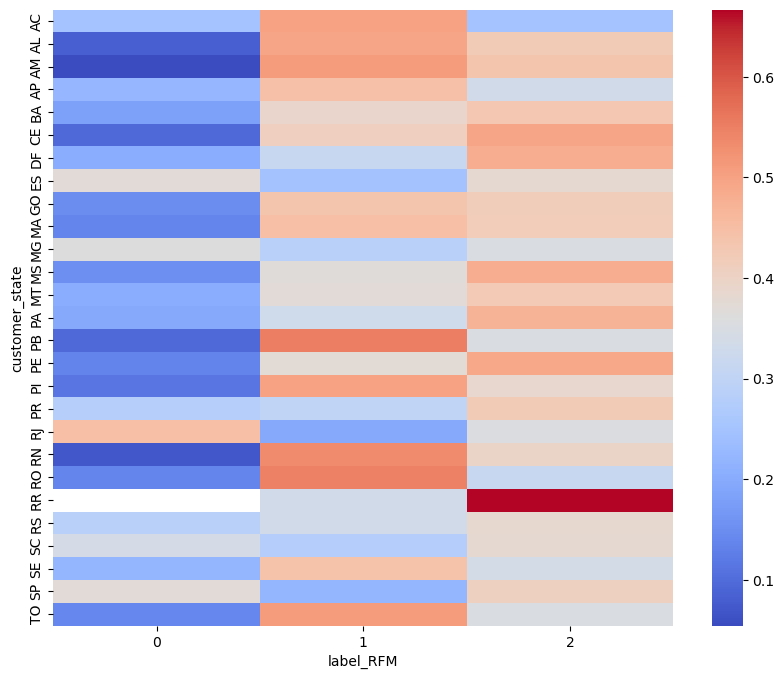

In [146]:
plt.figure(figsize = (10, 8))
sns.heatmap(target2, cmap = 'coolwarm', cbar = True)
plt.show()

- 군집 2 - 0 - 1 순서 표기

In [172]:
m = folium.Map(location = [-23.548994, -46.635731], zoom_start = 4)

for lat, lng in zip(label_0_zip_code.geolocation_lat, label_0_zip_code.geolocation_lng):
    folium.Circle(
        location=[lat, lng],
        radius=1, # 원 크기
        color='red', # 원 선 색상
        fill_color='red', # 원 내부 색상
        opacity=0.5
        # popup='Circle popup',
        # tooltip='Circle tooltip'
    ).add_to(m)


for lat, lng in zip(label_1_zip_code.geolocation_lat, label_1_zip_code.geolocation_lng):
    folium.Circle(
        location=[lat, lng],
        radius=1, # 원 크기
        color='gold', # 원 선 색상
        fill_color='gold', # 원 내부 색상
        opacity=0.5
        # popup='Circle popup',
        # tooltip='Circle tooltip'
    ).add_to(m)
    
for lat, lng in zip(label_2_zip_code.geolocation_lat, label_2_zip_code.geolocation_lng):
    folium.Circle(
        location=[lat, lng],
        radius=1, # 원 크기
        color='dodgerblue', # 원 선 색상
        fill_color='dodgerblue', # 원 내부 색상
        opacity=0.2
        # popup='Circle popup',
        # tooltip='Circle tooltip'
    ).add_to(m)
    
# for lat, lng in zip(label_3_zip_code.geolocation_lat, label_3_zip_code.geolocation_lng):
#     folium.Circle(
#         location=[lat, lng],
#         radius=3, # 원 크기
#         color='red', # 원 선 색상
#         fill_color='red', # 원 내부 색상
#         # popup='Circle popup',
#         # tooltip='Circle tooltip'
#     ).add_to(m)

m